In [23]:
import pandas as pd
import os

In [24]:
path = os.getcwd()

# load ad data (output from subregion.ipynb)
ads_df = pd.read_excel(f"{path}/intermediate/ads_data_final.xlsx")

ads_df.drop(columns=['Unnamed: 0'], inplace=True)
ads_df

,p_date,ad_id,delivery_country,queue_market,punish_num,latest_punish_begin_date,ad_revenue,avg_ad_revenue,start_time,baseline_st,product_line,task_type_en,punish_after_start_time,final_score,Subregion
0,20230807,1747578422390810,US,USCA,1,2023-07-24,71.639165,69.247744,2022-10-24 14:36:00.000000,1.78,Auction Ads,auction_relation,272,1.000000,Northern America
1,20230807,1758543228094480,SA,MENA,1,2023-06-14,44.455033,32.615441,2023-02-22 15:50:00.000000,1.67,RIE,Ad Group Recall (Merged),111,0.954532,Western Asia
2,20230807,1738303151826990,AU,AU,2,2023-07-24,1.317384,2.316247,2022-07-14 05:00:00.000000,1.84,Auction Ads,auction_relation,374,1.000000,Australia and New Zealand
3,20230807,1738303920938010,NZ,NZ,2,2023-07-24,3.496730,2.316247,2022-07-14 05:16:00.000000,1.58,Auction Ads,auction_relation,374,0.910277,Australia and New Zealand
4,20230807,1738304016410620,NZ,NZ,2,2023-07-24,1.234909,2.316247,2022-07-14 05:17:00.000000,1.58,Auction Ads,auction_relation,374,0.910277,Australia and New Zealand
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
40674,20230807,1773472206047230,VN,NaN,0,2000-01-01,0.541911,0.000000,2023-09-09 01:03:52.768014,0.54,Non-Auction Ads,Promote,0,0.038808,South-eastern Asia
40675,20230807,1773607712030720,BR,NaN,0,2000-01-01,0.541911,0.000000,2023-09-09 01:03:52.768014,0.54,Non-Auction Ads,Promote,0,0.038808,Latin America and the Caribbean
40676,20230807,1773589699308540,BE,NaN,0,2000-01-01,0.541911,0.000000,2023-09-09 01:03:52.768014,0.54,Non-Auction Ads,Promote,0,0.038808,Western Europe
40677,20230807,1773530511220730,TR,NaN,0,2000-01-01,0.541911,0.000000,2023-09-09 01:03:52.768014,0.54,Non-Auction Ads,Promote,0,0.038808,Western Asia


In [25]:
import math

# Load the Excel file into a dictionary of dataframes
excel_file = pd.ExcelFile('intermediate/mods_data_final.xlsx')  # Replace with your Excel file's path

# Initialize an empty dictionary to store dataframes
mkt_dict = {}

# Iterate through each sheet in the Excel file
for sheet_name in excel_file.sheet_names:
    # Read the sheet into a dataframe
    sheet_data = excel_file.parse(sheet_name)

    sheet_data.drop(columns=['Unnamed: 0'], inplace=True)
    sheet_data["max_ads"] = sheet_data["productivity"]*sheet_data["utilisation"]
    sheet_data["max_ads"] = [math.floor(x) for x in sheet_data["max_ads"]]
    sheet_data["no_of_ads"] = 0
    
    # Store the dataframe in the dictionary with the sheet name as the key
    mkt_dict[sheet_name] = sheet_data

mkt_dict["Western Asia"]

,moderator,market,productivity,utilisation,handling_time,accuracy,ad_capacity,final_score,Subregion,max_ads,no_of_ads
0,9020538,"[""PL"", ""PT"", ""GB"", ""IL""]",125.290000,0.000000,30487,0.250,0.000000,0.437888,"Eastern Europe, Southern Europe, Northern Euro...",0,0
1,2258595,"[""SA"", ""OM"", ""BH"", ""QA"", ""AE"", ""DZ"", ""JO"", ""IQ...",0.000000,0.000000,0,0.333,0.000000,0.590884,"Western Asia, Northern Africa",0,0
2,1749551102734338,"[""SA"", ""OM"", ""BH"", ""QA"", ""JO"", ""IQ"", ""KW"", ""MA...",394.541395,0.751938,114562,0.404,296.670661,0.957081,"Western Asia, Northern Africa",296,0
3,7363167,"[""SA"", ""BH"", ""OM"", ""QA"", ""AE"", ""JO"", ""IQ"", ""KW...",254.820000,0.540042,2578531,0.500,137.613418,0.596623,"Western Asia, Northern Africa",137,0
4,3500723,"[""SA"", ""OM"", ""QA"", ""AE"", ""TR"", ""PK"", ""KW"", ""MA...",0.000000,0.000000,0,0.608,0.000000,0.531551,"Western Asia, Southern Asia, Northern Africa",0,0
...,...,...,...,...,...,...,...,...,...,...,...
116,1746474353707041,"[""SA"", ""BH"", ""OM"", ""QA"", ""JO"", ""IQ"", ""KW"", ""MA...",531.680000,0.750000,67500,1.000,398.760000,0.748375,"Western Asia, Northern Africa",398,0
117,1686044707253249,"[""TR""]",297.790000,0.855729,96808,1.000,254.827589,0.725470,Western Asia,254,0
118,1668385955785733,"[""SA"", ""ME""]",298.673778,0.815556,125421,1.000,243.585059,0.708402,"Western Asia, Southern Europe",243,0
119,1689841547143170,"[""SA"", ""OM"", ""BH"", ""QA"", ""JO"", ""IQ"", ""KW"", ""EG...",286.217674,0.812403,123549,0.000,232.524126,0.319007,"Western Asia, Northern Africa",232,0


In [27]:
# get best match between ad and moderator across all mkt segment
def get_ad_moderator_match(ad_id, ad_score, queue_mkt, mkt_dict):

    mkt_df = mkt_dict[queue_mkt]
    # get best match between ad and moderator
    moderator, m_score, scores_diff = get_best_match(ad_score, mkt_df)
    mkt = queue_mkt

    # if max_ads = productivity * utilisation is larger than 0 -> moderator still has capacity to review ads
    if int(mkt_dict[mkt].loc[mkt_dict[mkt]["moderator"] == moderator, "max_ads"]) > 0:
        # deduct 1 from max_ads
        mkt_dict[mkt].loc[mkt_dict[mkt]["moderator"] == moderator, "max_ads"] -= 1
    # if max_ads = 0 is -> max_capacity is hit 
    else:
        # check how many ads the moderator reviewed past the capacity
        mkt_dict[mkt].loc[mkt_dict[mkt]["moderator"] == moderator, "no_of_ads"] += 1
    
    mismatch = abs(ad_score - m_score)

    #  add to output df
    new_row = {
        "ad_id": ad_id,
        "moderator_id": moderator,
        "ad_score": ad_score,
        "moderator_score": m_score,
        "mismatch_score": mismatch
    }

    return new_row, mkt_dict


# get match between ad and moderator in the mkt segment
def get_best_match(ad_score, mkt_df):

    # assume each extra ad reviewed past the capacity adds 1/(total no. of ads) to each score difference
    step = (1/40679)
    
    scores_diff = 1
    m_score = 0
    moderator = ""

    # loop through each subregion df
    for i in range(len(mkt_df["final_score"])):
        score = mkt_df["final_score"].iloc[i]

        # get mismatch score
        diff = abs(ad_score - score)
        
        # if ad_capacity is not hit
        if mkt_df["max_ads"].iloc[i] > 0:
            diff = abs(ad_score - score)

            # check if it is the current lowest score mismatch
            if diff < scores_diff:
                scores_diff = diff
                moderator = mkt_df["moderator"].iloc[i]
                m_score = score
        # if ad_capacity is hit
        else:
            # penalise score with step
            diff = abs(ad_score - score) + step*mkt_df["no_of_ads"].iloc[i]

            # check if it is the current lowest score mismatch
            if diff < scores_diff:
                scores_diff = diff
                moderator = mkt_df["moderator"].iloc[i]
                m_score = score

    if moderator == "":
        raise ValueError("No matching moderator found.")
    
    return moderator, m_score, scores_diff

In [28]:
# initialise output list
output = []

# loop through each ad
for i in range(len(ads_df["final_score"])):

    ad_id = ads_df["ad_id"].iloc[i]
    ad_score = ads_df["final_score"].iloc[i]
    queue_mkts = ads_df["Subregion"].iloc[i]

    result, new_mkt_dict = get_ad_moderator_match(ad_id, ad_score, queue_mkts, mkt_dict)
    mkt_dict = new_mkt_dict
    output.append(result)

# result df with ad id and score, moderator id and score and mismatch score
mapping_df = pd.DataFrame(output)
mapping_df

/var/folders/n5/nyw3dq1s69nd91ynn_2b589r0000gn/T/ipykernel_1996/1698544160.py:9: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  if int(mkt_dict[mkt].loc[mkt_dict[mkt]["moderator"] == moderator, "max_ads"]) > 0:
/var/folders/n5/nyw3dq1s69nd91ynn_2b589r0000gn/T/ipykernel_1996/1698544160.py:9: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  if int(mkt_dict[mkt].loc[mkt_dict[mkt]["moderator"] == moderator, "max_ads"]) > 0:
/var/folders/n5/nyw3dq1s69nd91ynn_2b589r0000gn/T/ipykernel_1996/1698544160.py:9: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  if int(mkt_dict[mkt].loc[mkt_dict[mkt]["moderator"] == moderator, "max_ads"]) > 0:
/var/folders/n5/nyw3dq1s69nd91ynn_2b589r0000gn/T/ipykernel_1996/1698544160.py:9: Futu

,ad_id,moderator_id,ad_score,moderator_score,mismatch_score
0,1747578422390810,3371590,1.000000,1.000000,0.000000
1,1758543228094480,1673359233746949,0.954532,0.955578,0.001046
2,1738303151826990,5090932,1.000000,0.872107,0.127893
3,1738303920938010,5090932,0.910277,0.872107,0.038170
4,1738304016410620,5090932,0.910277,0.872107,0.038170
...,...,...,...,...,...
40674,1773472206047230,9699751,0.038808,0.259152,0.220344
40675,1773607712030720,1005827,0.038808,0.108530,0.069722
40676,1773589699308540,1761892264652818,0.038808,0.022810,0.015998
40677,1773530511220730,3778633,0.038808,0.109581,0.070773


In [29]:
# number of unique moderators
mapping_df["moderator_id"].nunique()

446

In [30]:
# average mismatch score
mapping_df["mismatch_score"].mean()

0.09067684979401495

<Axes: >

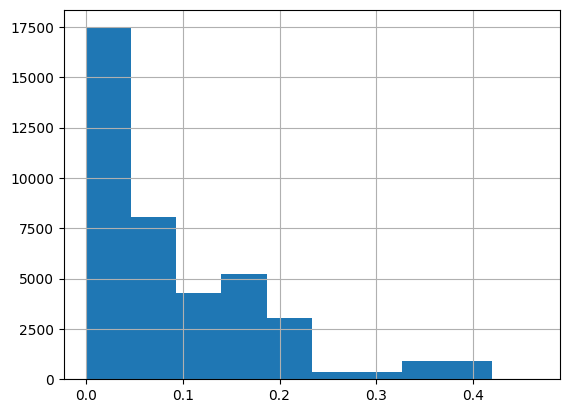

In [31]:
# mismatch score distribution
mapping_df["mismatch_score"].hist()

In [33]:
# output final scores to csv
mapping_df.to_csv('output/output.csv', index=False)